# Import necessary Libraries

In [1]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.metrics import confusion_matrix,accuracy_score, f1_score, roc_auc_score, classification_report, plot_roc_curve
from sklearn.metrics import precision_score,recall_score
import seaborn as sns

# 1).Data cleaning ,Encoding, Feature Distribution plot

In [2]:
df=pd.read_csv('/content/UCI_Credit_Card.csv')

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [5]:
df.isna().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [6]:
df.drop_duplicates()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [7]:
df.corr()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
ID,1.000000,0.026179,0.018497,0.039177,-0.029079,0.018678,-0.030575,-0.011215,-0.018494,-0.002735,...,0.040351,0.016705,0.016730,0.009742,0.008406,0.039151,0.007793,0.000652,0.003000,-0.013952
LIMIT_BAL,0.026179,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,...,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595,-0.153520
SEX,0.018497,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,...,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766,-0.039961
EDUCATION,0.039177,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,...,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200,0.028006
MARRIAGE,-0.029079,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,...,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641,-0.024339
AGE,0.018678,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,...,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478,0.013890
PAY_0,-0.030575,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,...,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673,0.324794
PAY_2,-0.011215,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,...,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500,0.263551
PAY_3,-0.018494,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,...,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861,0.235253
PAY_4,-0.002735,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,...,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565,0.216614


In [8]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


## Data Distribution plot

### 1).Limit_bal 

In [9]:
fig=px.scatter(df,x='LIMIT_BAL',color='ID')
fig.show()

### 2).Education plot

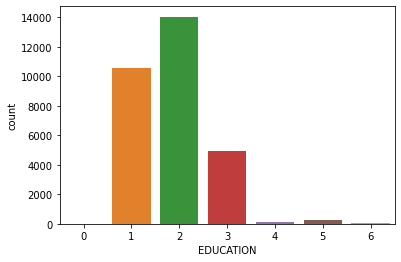

In [10]:
#before replace
ax = sns.countplot(x="EDUCATION", data=df)

from the above plot 0,5,6 are from same group as per project description so i am going to replace those

with one number using replace

In [11]:
df['EDUCATION']=df['EDUCATION'].replace({0:5,6:5,4:5})

In [12]:
#after replace
df1=df.copy()
df1['EDUCATION']=df1['EDUCATION'].replace({1:'School',2:'University',3:'Highschool',4:'Others',5:'Unknown',6:'Unknown',0:'Unknown'})
fig = px.histogram(df1, x="EDUCATION",color='EDUCATION')
fig.show()


### 3).Sex plot

In [13]:
df1['SEX']=df1['SEX'].replace({1:'Male',2:'Female'})
fig = px.histogram(df1, x="SEX",color='SEX')
fig.show()

### 4).Martial status plot

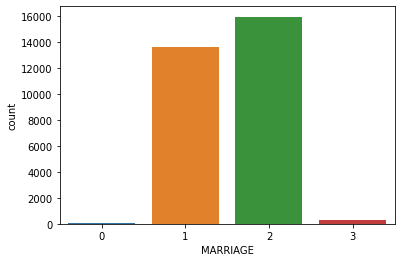

In [14]:
#before replace
ax = sns.countplot(x="MARRIAGE", data=df)

In [15]:
df['MARRIAGE']=df['MARRIAGE'].replace({0:3})

0 and three belongs to same group replacing those with same value

In [16]:
#after replace
df1['MARRIAGE']=df1['MARRIAGE'].replace({1:'Married',2:'Single',3:'Others',0:'Others'})
fig = px.histogram(df1, x="MARRIAGE",color='MARRIAGE')
fig.show()
#most of the customers are single 

### 5).AGE plot

In [17]:
fig=px.scatter(df1,x='AGE')
fig.show()

from this above plot we can see that most of the customers are from 20 to 60 age range

### 6).Pay

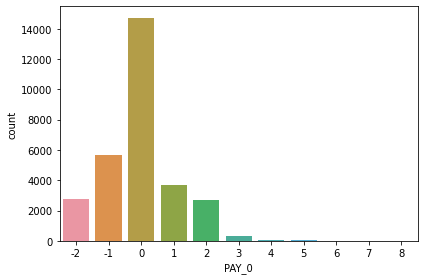

In [18]:
ax = sns.countplot(x="PAY_0", data=df)
import matplotlib.pyplot as plt

plt.tight_layout()

as per project description 0,-1,-2 are same group replacing those with same value

In [19]:
df['PAY_0']=df['PAY_0'].replace({-2:0,-1:0})

In [20]:
df['PAY_0'].value_counts()

0    23182
1     3688
2     2667
3      322
4       76
5       26
8       19
6       11
7        9
Name: PAY_0, dtype: int64

In [21]:
df1['PAY_0']=df1['PAY_0'].replace({-1:'Pay_duly',-2:'Pay_duly',0:'Pay_duly',1:'One_month_delay',2:'Two_month_delay',3:'Three_month_delay',4:'Four_month_delay',5:'Five_month_delay',6:'Six_month_delay',7:'Seven_month_delay',8:'Eight_month_delay'})
fig = px.histogram(df1, x="PAY_0",color='PAY_0',title='Credit card Repayment status in September 2005')
fig.show()

most of the customers are paying their payment correctly on september month

In [22]:
df1['PAY_2']=df1['PAY_2'].replace({-1:'Pay_duly',-2:'Pay_duly',0:'Pay_duly',1:'One_month_delay',2:'Two_month_delay',3:'Three_month_delay',4:'Four_month_delay',5:'Five_month_delay',6:'Six_month_delay',7:'Seven_month_delay',8:'Eight_month_delay'})
fig = px.histogram(df1, x="PAY_2",color='PAY_2',title='Credit card Repayment status in August 2005')
fig.show()

In [23]:
df['PAY_2']=df['PAY_2'].replace({-2:0,-1:0})

In [24]:
df['PAY_2'].value_counts()

0    25562
2     3927
3      326
4       99
1       28
5       25
7       20
6       12
8        1
Name: PAY_2, dtype: int64

In [25]:
df1['PAY_3']=df1['PAY_3'].replace({-1:'Pay_duly',-2:'Pay_duly',0:'Pay_duly',1:'One_month_delay',2:'Two_month_delay',3:'Three_month_delay',4:'Four_month_delay',5:'Five_month_delay',6:'Six_month_delay',7:'Seven_month_delay',8:'Eight_month_delay'})
fig = px.histogram(df1, x="PAY_3",color='PAY_3',title='Credit card Repayment status in July 2005')
fig.show()

In [26]:
df['PAY_3']=df['PAY_3'].replace({-2:0,-1:0})

In [27]:
df['PAY_3'].value_counts()

0    25787
2     3819
3      240
4       76
7       27
6       23
5       21
1        4
8        3
Name: PAY_3, dtype: int64

In [28]:
df1['PAY_4']=df1['PAY_4'].replace({-1:'Pay_duly',-2:'Pay_duly',0:'Pay_duly',1:'One_month_delay',2:'Two_month_delay',3:'Three_month_delay',4:'Four_month_delay',5:'Five_month_delay',6:'Six_month_delay',7:'Seven_month_delay',8:'Eight_month_delay'})
fig = px.histogram(df1, x="PAY_4",color='PAY_4',title='Credit card Repayment status in June 2005')
fig.show()

In [29]:
df['PAY_4']=df['PAY_4'].replace({-2:0,-1:0})

In [30]:
df['PAY_4'].value_counts()

0    26490
2     3159
3      180
4       69
7       58
5       35
6        5
1        2
8        2
Name: PAY_4, dtype: int64

In [31]:
df1['PAY_5']=df1['PAY_5'].replace({-1:'Pay_duly',-2:'Pay_duly',0:'Pay_duly',1:'One_month_delay',2:'Two_month_delay',3:'Three_month_delay',4:'Four_month_delay',5:'Five_month_delay',6:'Six_month_delay',7:'Seven_month_delay',8:'Eight_month_delay'})
fig = px.histogram(df1, x="PAY_5",color='PAY_5',title='Credit card Repayment status in May 2005')
fig.show()

In [32]:
df['PAY_5']=df['PAY_5'].replace({-2:0,-1:0})

In [33]:
df['PAY_5'].value_counts()

0    27032
2     2626
3      178
4       84
7       58
5       17
6        4
8        1
Name: PAY_5, dtype: int64

In [34]:
df1['PAY_6']=df1['PAY_6'].replace({-1:'Pay_duly',-2:'Pay_duly',0:'Pay_duly',1:'One_month_delay',2:'Two_month_delay',3:'Three_month_delay',4:'Four_month_delay',5:'Five_month_delay',6:'Six_month_delay',7:'Seven_month_delay',8:'Eight_month_delay'})
fig = px.histogram(df1, x="PAY_6",color='PAY_6',title='Credit card Repayment status in April 2005')
fig.show()

In [35]:
df['PAY_6']=df['PAY_6'].replace({-2:0,-1:0})

In [36]:
df['PAY_6'].value_counts()

0    26921
2     2766
3      184
4       49
7       46
6       19
5       13
8        2
Name: PAY_6, dtype: int64

### 7).Bill_Amount

In [37]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,0,0,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,0,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,0,0,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [38]:
df['BILL_AMT1'].value_counts()

0.0         2008
390.0        244
780.0         76
326.0         72
316.0         63
            ... 
11636.0        1
146034.0       1
20817.0        1
1351.0         1
47929.0        1
Name: BILL_AMT1, Length: 22723, dtype: int64

In [39]:
fig = go.Figure(go.Scatter(
    y=df['BILL_AMT1']
    ,x=df['ID']))

fig.update_layout(yaxis_title="Amount in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Amount of bill Statement in September 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [40]:
df['BILL_AMT1'].mean()

51223.3309

Average amount of bill statement in sep is 51223

---



In [41]:
fig = go.Figure(go.Scatter(
    y=df['BILL_AMT2'],
    x=df['ID']))

fig.update_layout(yaxis_title="Amount in New Taiwan Dollars",
    xaxis_title="CUSTOMER _ID",
    legend_title="Legend Title",
    title={
        'text': "Amount of bill Statement in August 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [42]:
df['BILL_AMT2'].mean()
#AVERAGE bill amount in august is

49179.07516666667

In [43]:
fig = go.Figure(go.Scatter(
    y=df['BILL_AMT3'],
    x=df['ID']))

fig.update_layout(yaxis_title="Amount in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Amount of bill Statement in July 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [44]:
df['BILL_AMT3'].mean()
#AVERAGE bill amount in july is

47013.1548

In [45]:
fig = go.Figure(go.Scatter(
    y=df['BILL_AMT4'],
    x=df['ID']))

fig.update_layout(yaxis_title="Amount in New Taiwan Dollars",
    xaxis_title="Index",
    legend_title="Legend Title",
    title={
        'text': "Amount of bill Statement in June 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [46]:
df['BILL_AMT4'].mean()
#AVERAGE bill amount in June is

43262.94896666666

In [47]:
fig = go.Figure(go.Scatter(
    y=df['BILL_AMT5'],
    x=df['ID']))

fig.update_layout(yaxis_title="Amount in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Amount of bill Statement in May 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [48]:
df['BILL_AMT5'].mean()
#AVERAGE bill amount in May is

40311.40096666667

In [49]:
fig = go.Figure(go.Scatter(
    y=df['BILL_AMT6'],
    x=df['ID']))

fig.update_layout(yaxis_title="Amount in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Amount of bill Statement in April 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [50]:
df['BILL_AMT6'].mean()
#AVERAGE bill amount in April is

38871.7604

### 8)Bill_Amount - Paid_amount vs customers 


In [51]:
fig = go.Figure(go.Scatter(
    y=(df['BILL_AMT1']-df['PAY_AMT1']),
    x=df['ID'],  marker=dict(
        color="green"
    )))
fig.update_layout(yaxis_title="Amount paid and due in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Difference between BILL_amount and paid_amount of every customer in September 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()
#in september many customers are no paid the exact amount of bill amount

In [52]:
fig = go.Figure(go.Scatter(
    y=(df['BILL_AMT2']-df['PAY_AMT2']),
    x=df['ID'],  marker=dict(
        color="green"
    )))
fig.update_layout(yaxis_title="Amount paid and due in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Difference between BILL_amount and paid_amount of every customer in August 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()
#in august most of them paid without due

In [53]:
fig = go.Figure(go.Scatter(
    y=(df['BILL_AMT3']-df['PAY_AMT3']),
    x=df['ID'],  marker=dict(
        color="green"
    )))
fig.update_layout(yaxis_title="Amount paid and due in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Difference between BILL_amount and paid_amount of every customer in July 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [54]:
fig = go.Figure(go.Scatter(
    y=(df['BILL_AMT4']-df['PAY_AMT4']),
    x=df['ID'],  marker=dict(
        color="green"
    )))
fig.update_layout(yaxis_title="Amount paid and due in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Difference between BILL_amount and paid_amount of every customer in JUNE 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [55]:
fig = go.Figure(go.Scatter(
    y=(df['BILL_AMT5']-df['PAY_AMT5']),
    x=df['ID'],  marker=dict(
        color="green"
    )))
fig.update_layout(yaxis_title="Amount paid and due in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Difference between BILL_amount and paid_amount of every customer in May 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

In [56]:
fig = go.Figure(go.Scatter(
    y=(df['BILL_AMT6']-df['PAY_AMT6']),
    x=df['ID'],  marker=dict(
        color="green"
    )))
fig.update_layout(yaxis_title="Amount paid and due in New Taiwan Dollars",
    xaxis_title="Customer_id",
    legend_title="Legend Title",
    title={
        'text': "Difference between BILL_amount and paid_amount of every customer in April 2005",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        })

fig.show()

### Target_plot

In [57]:
df1['default.payment.next.month']=df1['default.payment.next.month'].replace({1:'Yes',0:'No'})
fig = px.histogram(df1, x="default.payment.next.month",color='default.payment.next.month',title='Default_Payment_Next_Month')
fig.show()
#from this plot we can see it is an imbalanced dataset

In [58]:
df1.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

#2). EDA - Target vs Features plot

### 1).Limit_bal VS Default_payment_next_month

[Text(0.5, 1.0, 'LIMIT_BAL VS Default payment')]

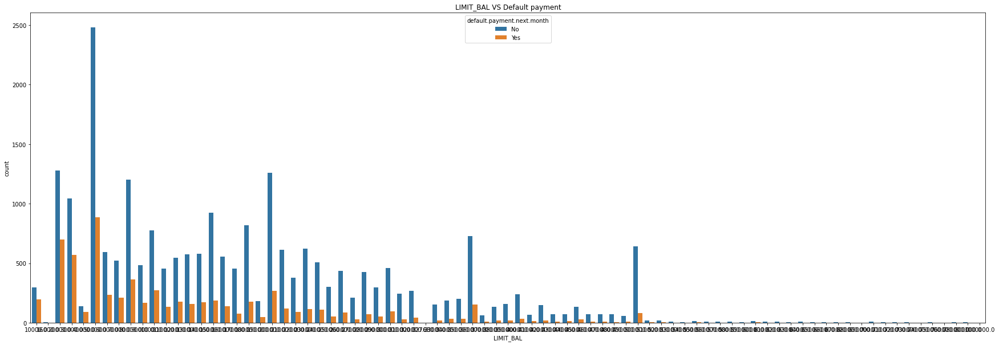

In [59]:
df2=df1.sort_values(['LIMIT_BAL'])
from matplotlib import pyplot
a4_dims = (30,10)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="LIMIT_BAL", hue="default.payment.next.month", data=df2).set(title='LIMIT_BAL VS Default payment')
#we can see that  limit balance of customer who are all have less are have less chances to pay next month bill 

### 2).Sex VS Default_payment_next_month

[Text(0.5, 1.0, 'SEX VS Default payment')]

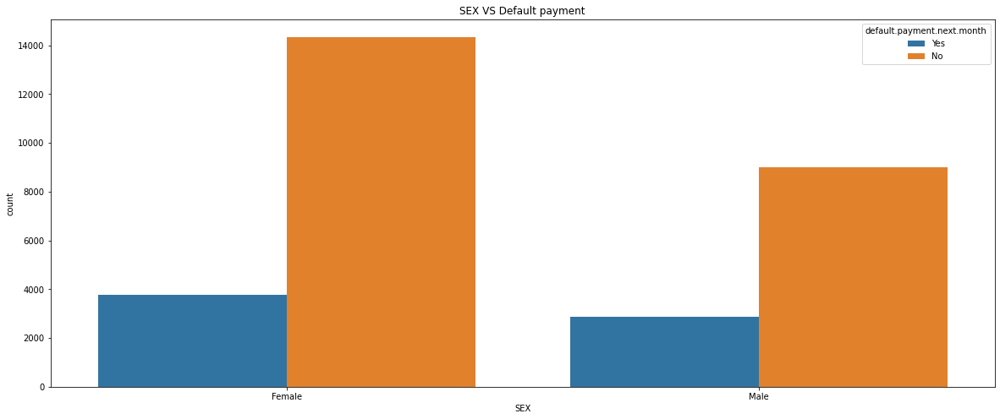

In [60]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="SEX", hue="default.payment.next.month", data=df1).set(title='SEX VS Default payment')

### 3)Education VS Default_payment_next_month

[Text(0.5, 1.0, 'EDUCATION VS Default payment')]

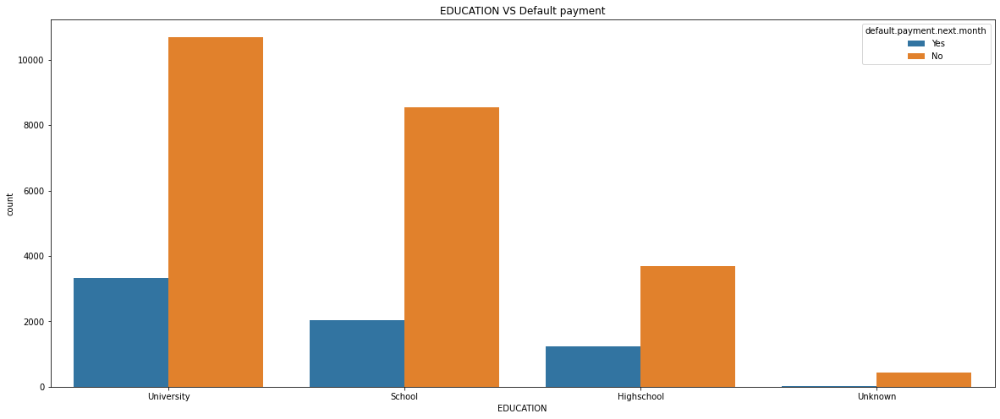

In [61]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="EDUCATION", hue="default.payment.next.month", data=df1).set(title='EDUCATION VS Default payment')

### 4)Marriage VS Default_payment_next_month

[Text(0.5, 1.0, 'MARRIAGE VS Default payment')]

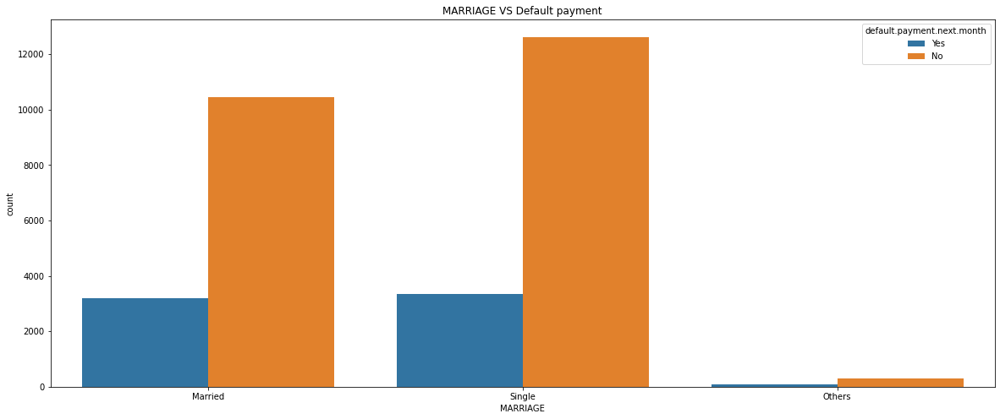

In [62]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="MARRIAGE", hue="default.payment.next.month", data=df1).set(title='MARRIAGE VS Default payment')

### 5).PAY VS Default_payment

[Text(0.5, 1.0, 'PAY_0 VS Default payment')]

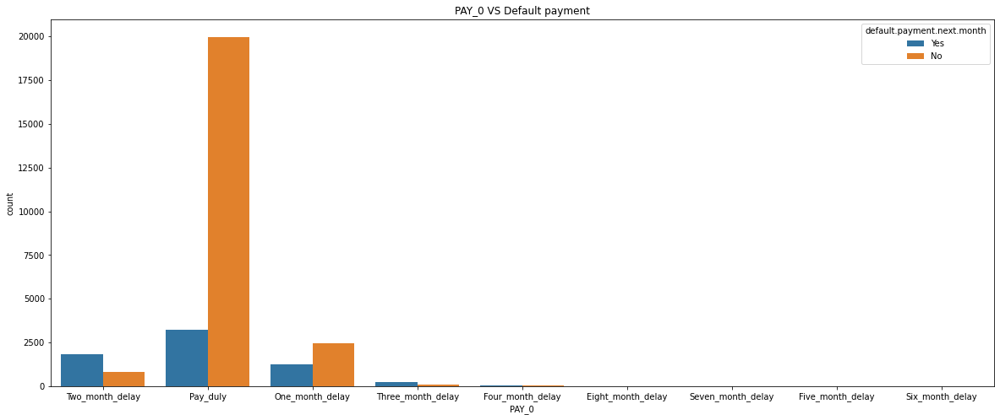

In [63]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="PAY_0", hue="default.payment.next.month", data=df1).set(title='PAY_0 VS Default payment')

[Text(0.5, 1.0, 'PAY_2 VS Default payment')]

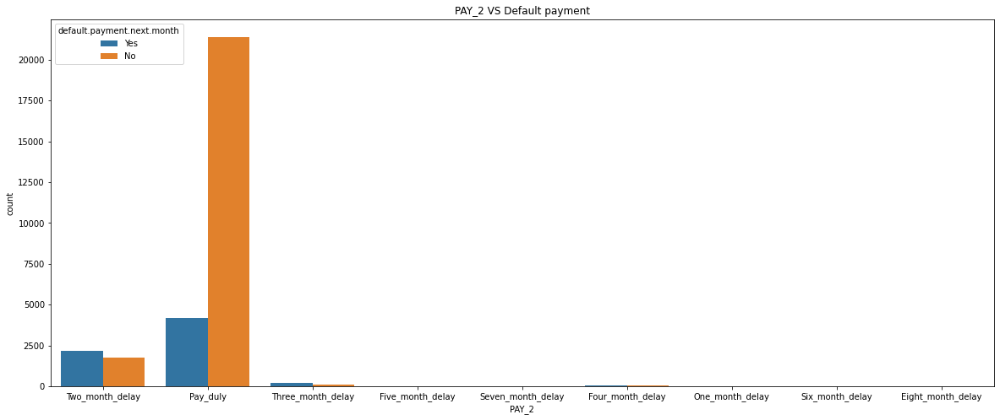

In [64]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="PAY_2", hue="default.payment.next.month", data=df1).set(title='PAY_2 VS Default payment')

[Text(0.5, 1.0, 'PAY_3 VS Default payment')]

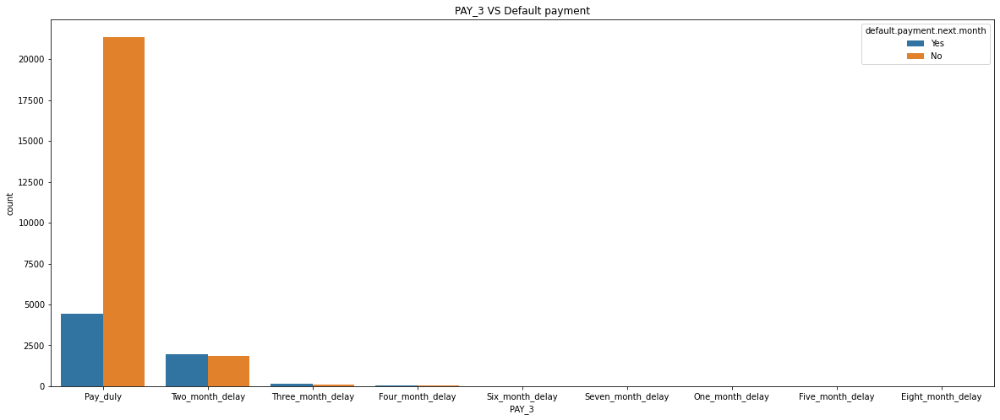

In [65]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="PAY_3", hue="default.payment.next.month", data=df1).set(title='PAY_3 VS Default payment')

[Text(0.5, 1.0, 'PAY_4 VS Default payment')]

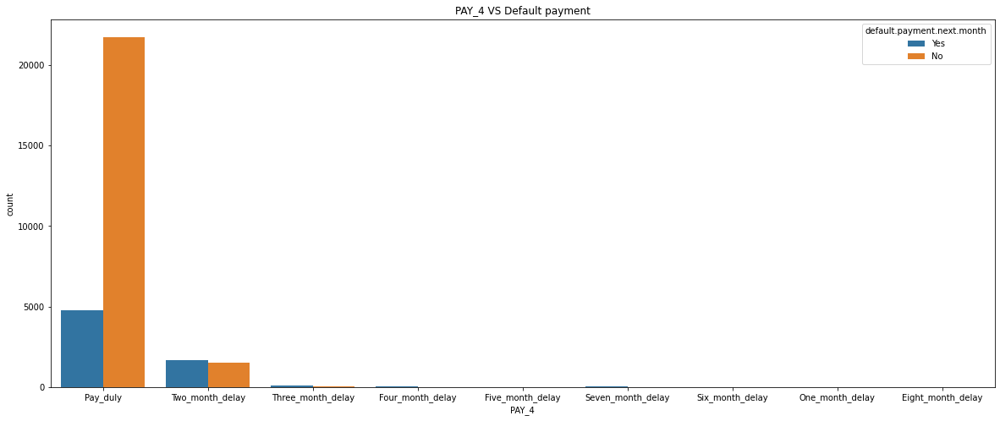

In [66]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="PAY_4", hue="default.payment.next.month", data=df1).set(title='PAY_4 VS Default payment')

[Text(0.5, 1.0, 'PAY_5 VS Default payment')]

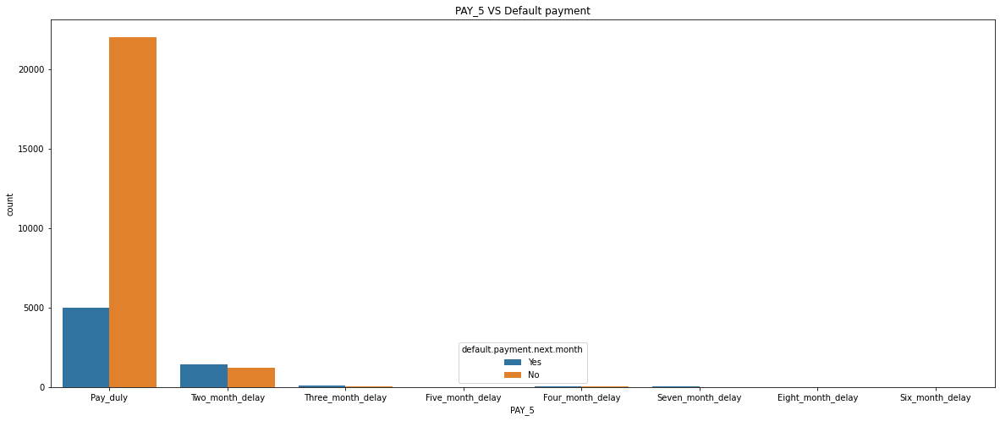

In [67]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="PAY_5", hue="default.payment.next.month", data=df1).set(title='PAY_5 VS Default payment')

[Text(0.5, 1.0, 'PAY_2 VS Default payment')]

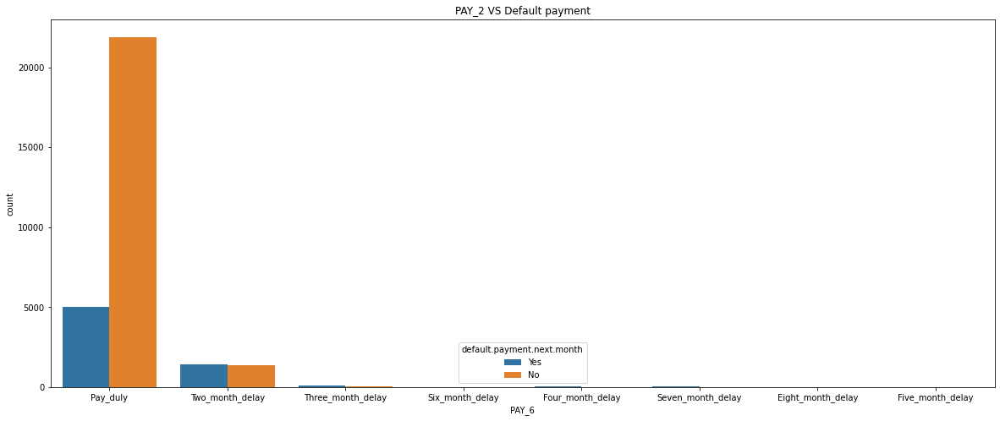

In [68]:
a4_dims = (20,8)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.countplot(x="PAY_6", hue="default.payment.next.month", data=df1).set(title='PAY_2 VS Default payment')

### 6).BILL_AMT1-PAY_AMT1 vs Default_payment_next_month

In [69]:
fig = px.pie(df1, values=(df['BILL_AMT1']-df['PAY_AMT1']), names='default.payment.next.month',title='BILL_AMT1-PAY_AMT1 vs Default_payment_next_month')
fig.show()

In [70]:
fig = px.pie(df1, values=(df['BILL_AMT2']-df['PAY_AMT2']), names='default.payment.next.month',title='BILL_AMT2-PAY_AMT2 vs Default_payment_next_month')
fig.show()

In [71]:
fig = px.pie(df1, values=(df['BILL_AMT3']-df['PAY_AMT3']), names='default.payment.next.month',title='BILL_AMT3-PAY_AMT3 vs Default_payment_next_month')
fig.show()

In [72]:
fig = px.pie(df1, values=(df['BILL_AMT4']-df['PAY_AMT4']), names='default.payment.next.month',title='BILL_AMT4-PAY_AMT4 vs Default_payment_next_month')
fig.show()

In [73]:
fig = px.pie(df1, values=(df['BILL_AMT5']-df['PAY_AMT5']), names='default.payment.next.month',title='BILL_AMT5-Pay_amt vs Default_payment_next_month')
fig.show()

In [74]:
fig = px.pie(df1, values=(df['BILL_AMT6']-df['PAY_AMT6']), names='default.payment.next.month',title='BILL_AMT6 vs Default_payment_next_month')
fig.show()

# 3).Data splitting and imbalanced learning

In [75]:
df2=df.copy()
df2 = pd.get_dummies(df2, columns=["EDUCATION"])


In [76]:
df2.head()

,ID,LIMIT_BAL,SEX,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_5
0,1,20000.0,2,1,24,2,2,0,0,0,...,689.0,0.0,0.0,0.0,0.0,1,0,1,0,0
1,2,120000.0,2,2,26,0,2,0,0,0,...,1000.0,1000.0,1000.0,0.0,2000.0,1,0,1,0,0
2,3,90000.0,2,2,34,0,0,0,0,0,...,1500.0,1000.0,1000.0,1000.0,5000.0,0,0,1,0,0
3,4,50000.0,2,1,37,0,0,0,0,0,...,2019.0,1200.0,1100.0,1069.0,1000.0,0,0,1,0,0
4,5,50000.0,1,1,57,0,0,0,0,0,...,36681.0,10000.0,9000.0,689.0,679.0,0,0,1,0,0


In [77]:
df2.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3',
       'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
       'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2',
       'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month', 'EDUCATION_1', 'EDUCATION_2',
       'EDUCATION_3', 'EDUCATION_5'],
      dtype='object')

In [78]:
X=df2.drop(['ID','default.payment.next.month'],axis=1)
Y=df2['default.payment.next.month']

In [79]:
Y

0        1
1        1
2        0
3        0
4        0
        ..
29995    0
29996    0
29997    1
29998    1
29999    1
Name: default.payment.next.month, Length: 30000, dtype: int64

###1). converting inbalanced data into balanced data using Smote and Tomek links

In [80]:
from imblearn.combine import SMOTETomek


smt = SMOTETomek(sampling_strategy='all')
X_smt, y_smt = smt.fit_resample(X,Y)

In [81]:

print('original dataset shape:', Y.value_counts())
print('Resample dataset shape', y_smt.value_counts())

original dataset shape: 0    23364
1     6636
Name: default.payment.next.month, dtype: int64
Resample dataset shape 1    22734
0    22734
Name: default.payment.next.month, dtype: int64


### 2).Data splitting

In [82]:
x_train, x_test, y_train, y_test = train_test_split(X_smt,y_smt,test_size = 0.3,random_state = 18)

#4).Task-Supervised Learning-classification Algorithms

### 1).Logistic Regression 

In [83]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train,y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [84]:
lr.coef_

array([[-6.38509729e-07,  4.04005768e-06,  3.05760164e-06,
         3.51414669e-04,  2.90704750e-05,  2.56625893e-05,
         2.20229307e-05,  2.08523606e-05,  1.87074240e-05,
         1.76811917e-05, -7.87203378e-06,  5.56282005e-06,
         2.06805312e-06,  1.14405904e-06, -5.76884221e-07,
         5.28806865e-06, -2.69114609e-05, -1.31647493e-05,
        -9.90442943e-06, -1.09039098e-05, -8.67801400e-06,
        -5.11885476e-06, -5.92096502e-06, -3.15626987e-06,
        -2.74311868e-06, -6.81369301e-07]])

In [85]:
lr.intercept_

array([9.78844478e-06])

In [86]:
print(lr.score(X_smt,y_smt))

0.5865223893727457


In [87]:
y_pred=lr.predict(x_test)
y_pred

array([1, 0, 0, ..., 0, 0, 0])

In [88]:
print("Recall:", round(recall_score(y_test, lr.predict(x_test)), 2))

Recall: 0.4


In [89]:
acc=accuracy_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
auroc=roc_auc_score(y_test,y_pred)
print(acc,f1,auroc)
print(confusion_matrix(y_test,y_pred))

0.5896195293600176 0.49512987012987003 0.5902713830929123
[[5298 1499]
 [4099 2745]]


In [90]:
yt_pred=lr.predict(x_train)
yt_pred

array([1, 0, 0, ..., 0, 1, 0])

In [91]:
lr_acc=accuracy_score(y_train,yt_pred)
lr_f1=f1_score(y_train,yt_pred)
lr_auroc=roc_auc_score(y_train,yt_pred)
print(lr_acc,lr_f1,lr_auroc)
print(confusion_matrix(y_train,yt_pred))

0.5851949602538725 0.48490050721810374 0.58490870262325
[[12411  3526]
 [ 9676  6214]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



0.49512987012987003

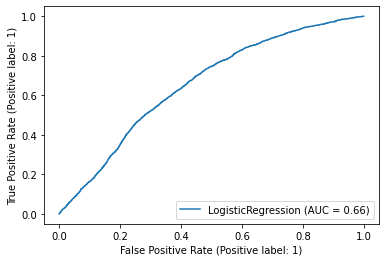

In [92]:
# #print(classification_report(y_test, y_pred))
plot_roc_curve(lr, x_test, y_test) 
f1_score(y_test,y_pred)

### 2).Decisssion tree

In [93]:
from sklearn.tree import DecisionTreeClassifier
for depth in [1,2,3,4,5,6,7,8,9,10,11,12,15,17,19,20,40,60]:
  dt = DecisionTreeClassifier(max_depth=depth) # will tell the DT to not grow past the given threhsold
  # Fit dt to the training set
  dt.fit(x_train, y_train) # the model is trained
  trainAccuracy = accuracy_score(y_train, dt.predict(x_train)) # this is useless information - i am showing to prove a point
  dt = DecisionTreeClassifier(max_depth=depth) # a fresh model which is not trained yet
  valAccuracy = cross_val_score(dt, x_train, y_train, cv=10) # syntax : cross_val_Score(freshModel,fts, target, cv= 10/5)
  print("Depth  : ", depth, " Training Accuracy : ", trainAccuracy, " Cross val score : " ,np.mean(valAccuracy))

Depth  :  1  Training Accuracy :  0.6672322242121469  Cross val score :  0.6672327534337923
Depth  :  2  Training Accuracy :  0.6723536619851069  Cross val score :  0.6722596750137684
Depth  :  3  Training Accuracy :  0.7205517328054796  Cross val score :  0.7203950690273379
Depth  :  4  Training Accuracy :  0.7251704527602351  Cross val score :  0.7236627131921173
Depth  :  5  Training Accuracy :  0.7396235900336192  Cross val score :  0.7350364710544883
Depth  :  6  Training Accuracy :  0.7545166053979325  Cross val score :  0.7553652999820504
Depth  :  7  Training Accuracy :  0.7847425142174883  Cross val score :  0.777893015870571
Depth  :  8  Training Accuracy :  0.8042856694001949  Cross val score :  0.7897066399850083
Depth  :  9  Training Accuracy :  0.8240801834920036  Cross val score :  0.7971533640472552
Depth  :  10  Training Accuracy :  0.8436547585383479  Cross val score :  0.7981903094160069
Depth  :  11  Training Accuracy :  0.861752599993716  Cross val score :  0.79941

In [94]:
dt=DecisionTreeClassifier(max_depth=11)
dt.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=11)

In [95]:
y_pred=dt.predict(x_test)
y_pred

array([1, 0, 1, ..., 0, 0, 1])

In [96]:
dt_acc=accuracy_score(y_test,y_pred)
dt_f1=f1_score(y_test,y_pred)
dt_auroc=roc_auc_score(y_test,y_pred)
print(dt_acc,dt_f1,dt_auroc)
print(confusion_matrix(y_test,y_pred))

0.7931969796935708 0.7877830437072143 0.79329429638871
[[5584 1213]
 [1608 5236]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



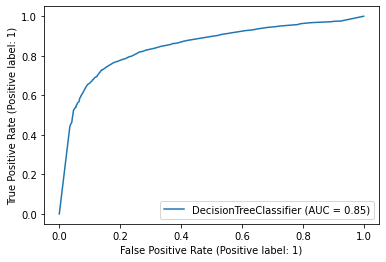

In [97]:
plot_roc_curve(dt, x_test, y_test)

### 3).NaiveBayes

In [98]:
param_grid_nb = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

In [99]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
nbModel_grid = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1)
nbModel_grid.fit(x_train,y_train)
print(nbModel_grid.best_estimator_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
GaussianNB(var_smoothing=1.0)


In [100]:
y_pred = nbModel_grid.predict(x_test)
print(y_pred)

[1 0 1 ... 1 1 1]


In [101]:
nb_acc=accuracy_score(y_test,y_pred)
nb_f1=f1_score(y_test,y_pred)
nb_auroc=roc_auc_score(y_test,y_pred)
print(nb_acc,nb_f1,nb_auroc)
print(confusion_matrix(y_test,y_pred))

0.5630085770837915 0.652844912934599 0.5621236295931775
[[2075 4722]
 [1239 5605]]


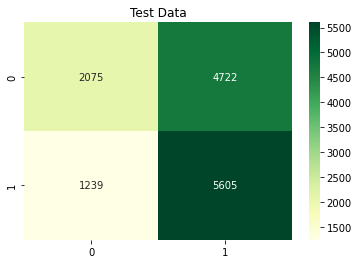

In [102]:
sns.heatmap((confusion_matrix(y_test,y_pred)),annot=True,fmt='.5g',cmap="YlGn").set_title('Test Data');

### 4).KNN

In [103]:
#scaling the data
sc = StandardScaler()
X_train = sc.fit_transform(x_train)
X_test = sc.transform(x_test)

In [104]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 7)
classifier.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6)

In [105]:
y_pred = classifier.predict(X_test)

In [106]:
knn_acc=accuracy_score(y_test,y_pred)
knn_f1=f1_score(y_test,y_pred)
knn_auroc=roc_auc_score(y_test,y_pred)
print(knn_acc,knn_f1,knn_auroc)
print(confusion_matrix(y_test,y_pred))

0.7981086430613591 0.7831496062992126 0.7983558020190948
[[5914  883]
 [1871 4973]]


In [107]:
for depth in [1,2,3,4,5,6,7,8,9,10,11,12,15]:
  kn = KNeighborsClassifier(n_neighbors=depth) # will tell the DT to not grow past the given threhsold
  # Fit dt to the training set
  kn.fit(X_train, y_train) # the model is trained
  trainAccuracy = accuracy_score(y_train, kn.predict(X_train)) # this is useless information - i am showing to prove a point
  kn1 = KNeighborsClassifier(n_neighbors=depth) # a fresh model which is not trained yet
  valAccuracy = cross_val_score(kn1, X_train, y_train, cv=10) # syntax : cross_val_Score(freshModel,fts, target, cv= 10/5)
  print("Depth  : ", depth, " Training Accuracy : ", trainAccuracy, " Cross val score : " ,np.mean(valAccuracy))

Depth  :  1  Training Accuracy :  0.999403022590882  Cross val score :  0.7961477763408807
Depth  :  2  Training Accuracy :  0.9129669777233167  Cross val score :  0.8018977408462975
Depth  :  3  Training Accuracy :  0.8970999465862318  Cross val score :  0.7984412200816207
Depth  :  4  Training Accuracy :  0.8757030194488956  Cross val score :  0.8046623196416064
Depth  :  5  Training Accuracy :  0.8682879316303768  Cross val score :  0.8031857153604955
Depth  :  6  Training Accuracy :  0.8553743676752443  Cross val score :  0.8049452692286352
Depth  :  7  Training Accuracy :  0.8522009614478273  Cross val score :  0.8060448509355858
Depth  :  8  Training Accuracy :  0.8475508216294342  Cross val score :  0.8057622074214581
Depth  :  9  Training Accuracy :  0.8448172934929462  Cross val score :  0.8030914152870186
Depth  :  10  Training Accuracy :  0.8390988783108682  Cross val score :  0.8054793763142623
Depth  :  11  Training Accuracy :  0.8372451063562384  Cross val score :  0.8041

#5).Ensemble learning

### 1).Max voting

In [108]:
model1=LogisticRegression()
model2=DecisionTreeClassifier(max_depth=10)
model4=KNeighborsClassifier(n_neighbors = 4)
model3=GaussianNB(var_smoothing=1.0)
from sklearn.ensemble import VotingClassifier
model = VotingClassifier(estimators=[('lr', model1), ('dt',model2),('nb',model3),('knn',model4)], voting='hard')
model.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('dt', DecisionTreeClassifier(max_depth=10)),
                             ('nb', GaussianNB(var_smoothing=1.0)),
                             ('knn', KNeighborsClassifier(n_neighbors=4))])

In [109]:
y_pred = model.predict(x_test)

In [110]:
max_acc=accuracy_score(y_test,y_pred)
max_f1=f1_score(y_test,y_pred)
max_auroc=roc_auc_score(y_test,y_pred)
print(max_acc,max_f1,max_auroc)
print(confusion_matrix(y_test,y_pred))

0.7526574298071989 0.719627721455875 0.7530722719747693
[[5937  860]
 [2514 4330]]


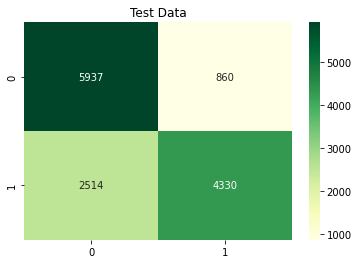

In [111]:
sns.heatmap((confusion_matrix(y_test,y_pred)),annot=True,fmt='.5g',cmap="YlGn").set_title('Test Data');

### 2).Averaging

In [112]:
model1=LogisticRegression()
model2=DecisionTreeClassifier(max_depth=10)
model4=KNeighborsClassifier(n_neighbors = 4)
model3=GaussianNB(var_smoothing=1.0)

model1.fit(x_train,y_train)
model2.fit(x_train,y_train)
model3.fit(x_train,y_train)
model4.fit(x_train,y_train)

pred1=model1.predict(x_test)
pred2=model2.predict(x_test)
pred3=model3.predict(x_test)
pred4=model4.predict(x_test)

finalpred=(pred1+pred2+pred3+pred4)/4

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [113]:
finalpred

array([1.  , 0.  , 0.75, ..., 0.5 , 0.25, 0.75])

In [114]:
max(finalpred)

1.0

In [115]:
a=[]
import math
for i in finalpred:
  if i<=0.5:
    a.append(0)
  else:
    a.append(1)

In [116]:
avg_acc=accuracy_score(y_test,a)
avg_f1=f1_score(y_test,a)
avg_auroc=roc_auc_score(y_test,a)
print(avg_acc,avg_f1,avg_auroc)
print(confusion_matrix(y_test,a))

0.7533172054834689 0.7204917351939529 0.753730792549778
[[5939  858]
 [2507 4337]]


###3). Random Forest

In [117]:
from sklearn.ensemble import RandomForestClassifier

In [120]:
from sklearn.ensemble import RandomForestClassifier
for k in [20,21,22,23,24,25,26,27,28]:
  clf = RandomForestClassifier( n_estimators=100,max_depth=k)  # will tell the DT to not grow past the given threhsold
  # Fit dt to the training set
  clf.fit(x_train, y_train) # the model is trained
  trainAccuracy = accuracy_score(y_train, clf.predict(x_train)) # this is useless information - i am showing to prove a point
  clf = RandomForestClassifier( n_estimators=100,max_depth=k)  # a fresh model which is not trained yet
  valAccuracy = cross_val_score(clf, x_train, y_train, cv=10) # syntax : cross_val_Score(freshModel,fts, target, cv= 10/5)
  print("Depth  : ", k, " Training Accuracy : ", trainAccuracy, " Cross val score : " ,np.mean(valAccuracy))

Depth  :  20  Training Accuracy :  0.9931504697269614  Cross val score :  0.8535833929188158
Depth  :  21  Training Accuracy :  0.9952870204543313  Cross val score :  0.8537720523056868
Depth  :  22  Training Accuracy :  0.9972978917271499  Cross val score :  0.8547773635591185
Depth  :  23  Training Accuracy :  0.9978948691362679  Cross val score :  0.8566000079381488
Depth  :  24  Training Accuracy :  0.9986803657272127  Cross val score :  0.8562854637290777
Depth  :  25  Training Accuracy :  0.9990574040908663  Cross val score :  0.8558456665902472
Depth  :  26  Training Accuracy :  0.9992145034090552  Cross val score :  0.8571341742636923
Depth  :  27  Training Accuracy :  0.999245923272693  Cross val score :  0.8562855822089104
Depth  :  28  Training Accuracy :  0.999403022590882  Cross val score :  0.8564740046361159


In [131]:
rf=RandomForestClassifier(max_depth=26)
rf.fit(x_train,y_train)

RandomForestClassifier(max_depth=26)

In [132]:
y_pred=rf.predict(x_test)
y_pred

array([1, 0, 1, ..., 0, 0, 1])

In [133]:
rf_acc=accuracy_score(y_test,y_pred)
rf_f1=f1_score(y_test,y_pred)
rf_auroc=roc_auc_score(y_test,y_pred)
print(rf_acc,rf_f1,rf_auroc)
print(confusion_matrix(y_test,y_pred))

0.8544095007697383 0.8500679450400122 0.8545194157321959
[[6025  772]
 [1214 5630]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



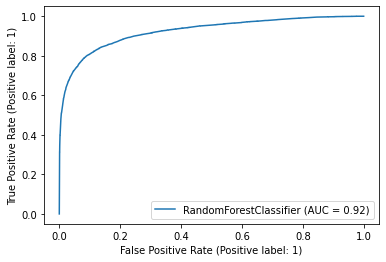

In [134]:
plot_roc_curve(rf,x_test, y_test)

###4). XGBoost

In [123]:
from xgboost import XGBClassifier

In [124]:
from xgboost import XGBClassifier
for lr in [0.01,0.02,0.03,0.04,0.05,0.1,0.11,0.12,0.13,0.14,0.15,0.2,0.5,0.7,1]:
  t = XGBClassifier(learning_rate = lr, n_estimators=100, verbosity = 0) # will tell the DT to not grow past the given threhsold
  # Fit dt to the training set
  t.fit(x_train, y_train) # the model is trained
  trainAccuracy = accuracy_score(y_train, t.predict(x_train)) # this is useless information - i am showing to prove a point
  t1 = XGBClassifier(learning_rate = lr, n_estimators=100, verbosity = 0)# a fresh model which is not trained yet
  valAccuracy = cross_val_score(t1, x_train, y_train, cv=10) # syntax : cross_val_Score(freshModel,fts, target, cv= 10/5)
  print("Depth  : ", lr, " Training Accuracy : ", trainAccuracy, " Cross val score : " ,np.mean(valAccuracy))


Depth  :  0.01  Training Accuracy :  0.7599522418072705  Cross val score :  0.7593557896058828
Depth  :  0.02  Training Accuracy :  0.8037515317183523  Cross val score :  0.8003579966876988
Depth  :  0.03  Training Accuracy :  0.8147170641279416  Cross val score :  0.8135543495625033
Depth  :  0.04  Training Accuracy :  0.8194300436736105  Cross val score :  0.8178275616870186
Depth  :  0.05  Training Accuracy :  0.822226411537374  Cross val score :  0.8190213842275302
Depth  :  0.1  Training Accuracy :  0.8270336506739561  Cross val score :  0.8240486612470042
Depth  :  0.11  Training Accuracy :  0.8279134068558143  Cross val score :  0.8251798375759976
Depth  :  0.12  Training Accuracy :  0.8297357589468062  Cross val score :  0.8259024460753853
Depth  :  0.13  Training Accuracy :  0.8321550884469161  Cross val score :  0.8267193941415277
Depth  :  0.14  Training Accuracy :  0.8323750274923807  Cross val score :  0.827787687299337
Depth  :  0.15  Training Accuracy :  0.83441731862883

In [125]:
model = XGBClassifier(learning_rate = 0.5, n_estimators=100)
model.fit(x_train,y_train) #train the model
xg_boost=model.score(x_train, y_train)
xg_boost

0.8565054827662048

In [126]:
y_pred=model.predict(x_test)
y_pred

array([1, 0, 1, ..., 0, 0, 1])

In [127]:
xg_acc=accuracy_score(y_test,y_pred)
xg_f1=f1_score(y_test,y_pred)
xg_auroc=roc_auc_score(y_test,y_pred)
print(xg_acc,xg_f1,xg_auroc)
print(confusion_matrix(y_test,y_pred))

0.8290447914375779 0.8192808431494112 0.8292407899555507
[[6023  774]
 [1558 5286]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



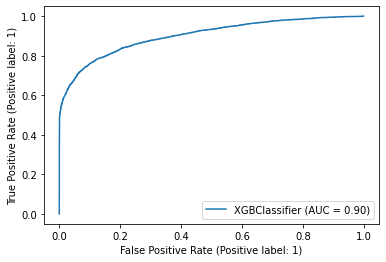

In [128]:
plot_roc_curve(model, x_test, y_test)

# 6).Validation of all Ensemble technique

In [135]:
data={'Ensembel_Learning_Technique':['Average','Max_voting','Baging_RandomForest','Boosting_XGB'],'Accuracy_Score':[avg_acc,max_acc,rf_acc,xg_acc],'Auroc_score':[avg_auroc,max_auroc,rf_auroc,xg_auroc],'F1_score':[avg_f1,max_f1,rf_f1,xg_f1]}

In [136]:
Best_model=pd.DataFrame(data)

In [137]:
Best_model

,Ensembel_Learning_Technique,Accuracy_Score,Auroc_score,F1_score
0,Average,0.753317,0.753731,0.720492
1,Max_voting,0.752657,0.753072,0.719628
2,Baging_RandomForest,0.854410,0.854519,0.850068
3,Boosting_XGB,0.829045,0.829241,0.819281


In [138]:
fig=px.bar(Best_model,x='Ensembel_Learning_Technique',y='Auroc_score',color='Ensembel_Learning_Technique',title='Comparing all Ensemble_learning_techniques')
fig.show()

## From this above plot we can see that Randomforest algorithm is the best model to predict Credictcard payment of next month

# 7).Feature Selection

In [154]:
X.columns

Index(['LIMIT_BAL', 'SEX', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3',
       'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
       'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2',
       'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'EDUCATION_1',
       'EDUCATION_2', 'EDUCATION_3', 'EDUCATION_5'],
      dtype='object')

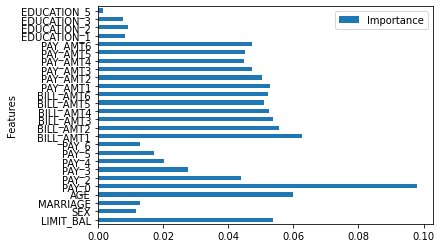

In [158]:
model=RandomForestClassifier(max_depth=26)
model.fit(X,Y)
imp=model.feature_importances_
final_df=pd.DataFrame({'Features':X.columns,'Importance':imp})
# final_df.set_index('Importance')
# final_df.sort_values('Importance')
final_df.plot(x='Features',y='Importance',kind='barh')
plt.show()


In [161]:
def get_feature_importance(clsf, ftrs):
    imp = clsf.feature_importances_.tolist()
    feat = ftrs
    result = pd.DataFrame({'feat':feat,'score':imp})
    result = result.sort_values(by=['score'],ascending=False)
    return result

get_feature_importance(model,X.columns)

,feat,score
4,PAY_0,0.097979
10,BILL_AMT1,0.062641
3,AGE,0.059869
11,BILL_AMT2,0.055650
12,BILL_AMT3,0.053898
0,LIMIT_BAL,0.053807
16,PAY_AMT1,0.052725
13,BILL_AMT4,0.052410
15,BILL_AMT6,0.052123
14,BILL_AMT5,0.050990


From this above data frame we can say that PAY_0,BILL_AMT1 and AGE are the most important features